# Project 4A

In [242]:
import numpy as np
from scipy.interpolate import griddata
from scipy import ndimage
from scipy.signal import convolve2d
from scipy.spatial import Delaunay, delaunay_plot_2d
import skimage as sk
import skimage.io as skio
import skimage.transform as sktr
from skimage.draw import polygon
from skimage.feature import corner_harris, peak_local_max
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import imageio
import cv2
import math
import json

## Shoot the Pictures

In [8]:
def get_image(file_path):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return img

## Recover Homographies

In [9]:
def get_image_points(correspondenceFile):
    points = json.load(open(correspondenceFile,))
    im1_pts, im2_pts = np.array(points["im1Points"]), np.array(points["im2Points"])

    return (im1_pts, im2_pts)

In [249]:
def computeH(im1_pts, im2_pts):
    A, b = np.zeros((len(im1_pts) * 2, 8)), np.zeros((len(im1_pts) * 2, 1))

    for i, (im1, im2) in enumerate(zip(im1_pts, im2_pts)):
        x, y, x_prime, y_prime = im1[0], im1[1], im2[0], im2[1]

        A[i * 2] = np.array([x, y, 1, 0, 0, 0, -x * x_prime, -y * x_prime])
        A[i * 2 + 1] = np.array([0, 0, 0, x, y, 1, -x * y_prime, -y * y_prime])

        b[i * 2] = x_prime
        b[i * 2 + 1] = y_prime
    
    h = np.linalg.lstsq(A, b, rcond=None)[0]
    h = np.append(h, 1)

    h = h.reshape(3, 3)

    return h


## Warp the Images

In [11]:
def imwarped(im, H):
    corners = np.array([
        [0, 0, 1],
        [len(im[0]), 0, 1],
        [0, len(im), 1],
        [len(im[0]), len(im), 1]
    ])

    warped_corners = np.matmul(H, corners.T)
    warped_corners = warped_corners / warped_corners[2]

    min_x_prime, min_y_prime, max_x_prime, max_y_prime = int(np.min(warped_corners[0])), int(np.min(warped_corners[1])), int(np.max(warped_corners[0])), int(np.max(warped_corners[1]))
    
    warped = np.zeros((max_y_prime - min_y_prime, max_x_prime - min_x_prime, 3))

    for row in range(len(warped)):
        for col in range(len(warped[0])):
            orig_pts = np.dot(np.linalg.inv(H), [col + min_x_prime, row + min_y_prime, 1])
            orig_pts = orig_pts / orig_pts[2]

            if 0 <= orig_pts[0] < len(im[0]) and 0 <= orig_pts[1] < len(im):
                for i in range(3):
                    warped[row, col, i] = im[int(orig_pts[1]), int(orig_pts[0]), i]
    
    bounding_box = np.array([[min_x_prime, min_y_prime], [min_x_prime, max_y_prime], [max_x_prime, min_y_prime], [max_x_prime, max_y_prime]])
        
    return (warped, bounding_box)

In [868]:
def show_image(im, points=None, with_points=False, with_axis=False, cmap=None, boxes=None, with_boxes=False, title=""):
    fig, ax = plt.subplots()

    if not with_axis:
        plt.axis('off')

    if with_points:
        ax.plot(points[:, 0], points[:, 1], 'bo', ms=3)

    if with_boxes:
        for corners in boxes:
            polygon = patches.Polygon(corners, closed=True, edgecolor='blue', linewidth=2, fill=False)
            ax.add_patch(polygon)

    if title:
        ax.set_title(title)
    
    if cmap:
        ax.imshow(im, cmap=cmap)
    else:
        ax.imshow(im)

    plt.show()

#### Warp Living Room Images

In [989]:
living_room1, living_room2 = get_image("../media/living_room/living_room1.jpg"), get_image("../media/living_room/living_room2.jpg")
living_room1_pts, living_room2_pts = get_image_points('../media/living_room/living_room1_living_room2.json')

In [990]:
H_living_room = computeH(living_room1_pts, living_room2_pts)

In [991]:
warped_test, warped_test_bounding_box = imwarped(living_room1, H_living_room)

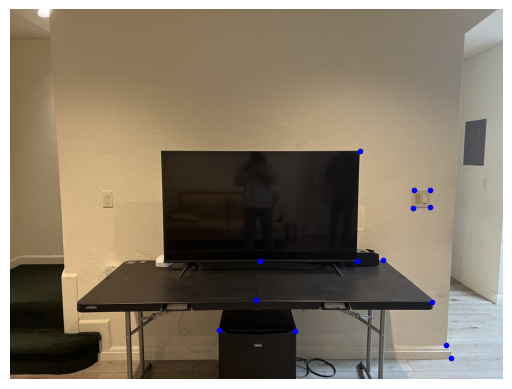

In [20]:
show_image(living_room1, living_room1_pts, with_points=True)

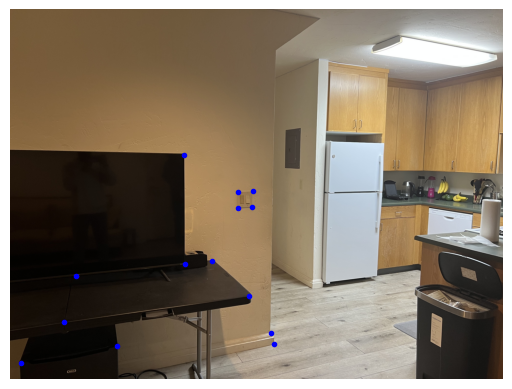

In [21]:
show_image(living_room2, living_room2_pts, with_points=True)

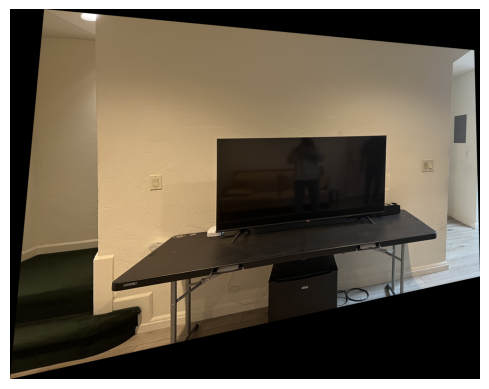

In [22]:
show_image(warped_test.astype(np.uint8))

#### Warp Car Poster Images

In [994]:
cars1, cars2 = get_image('../media/cars/cars1.jpg'), get_image('../media/cars/cars2.jpg')
cars1_pts, cars2_pts = get_image_points('../media/cars/cars1_cars2.json')

In [995]:
H_cars = computeH(cars1_pts, cars2_pts)

In [996]:
warped_cars, warped_cars_bounding_box = imwarped(cars1, H_cars)

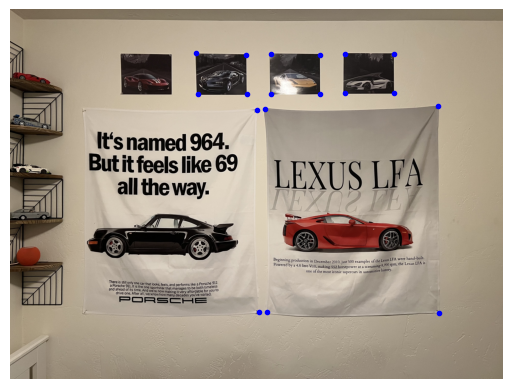

In [20]:
show_image(cars1, cars1_pts, with_points=True)

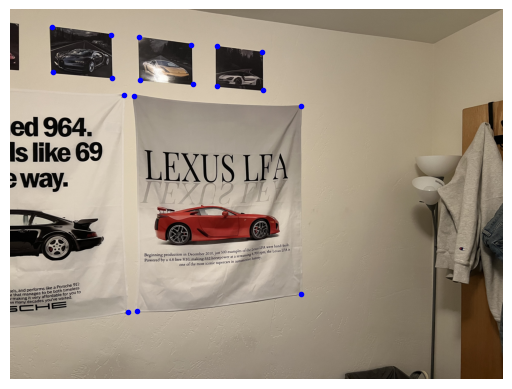

In [21]:
show_image(cars2, cars2_pts, with_points=True)

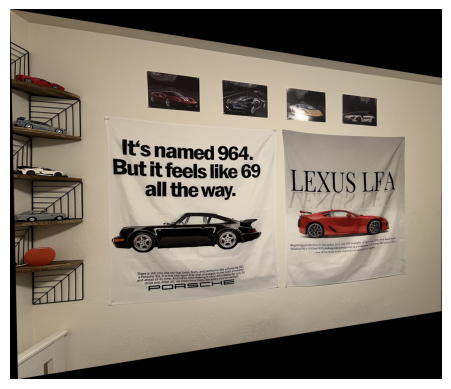

In [19]:
show_image(warped_cars.astype(np.uint8))

#### Warp Desk Images

In [957]:
desk1, desk2 = get_image('../media/desk/desk1.jpg'), get_image('../media/desk/desk2.jpg')
desk1_pts, desk2_pts = get_image_points('../media/desk/desk1_desk2.json')

In [997]:
H_desk = computeH(desk1_pts, desk2_pts)

In [998]:
desk_warped, desk_warped_bounding_box = imwarped(desk1, H_desk)

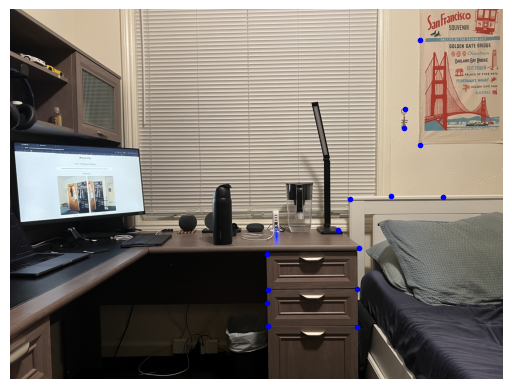

In [28]:
show_image(desk1, desk1_pts, with_points=True)

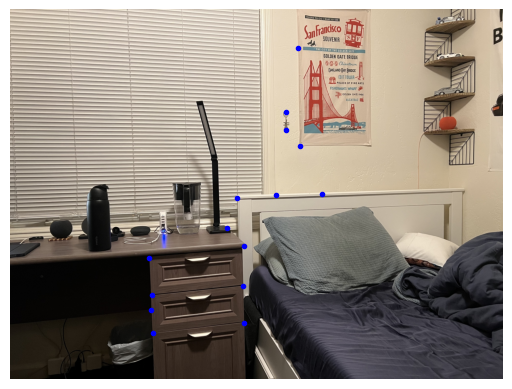

In [29]:
show_image(desk2, desk2_pts, with_points=True)

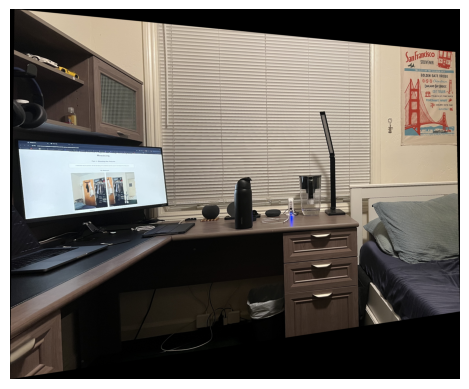

In [26]:
show_image(desk_warped.astype(np.uint8))

## Image Rectification

#### Rectify Museum Painting

In [87]:
paintings2 = get_image('../media/testing/paintings2.jpg')
painting2_pts1, paintings2_pts2 = get_image_points('../media/testing/paintings2.json')

paintings2_H = computeH(painting2_pts1, paintings2_pts2)

In [88]:
warped_paintings2 = imwarped(paintings2, paintings2_H)[0]

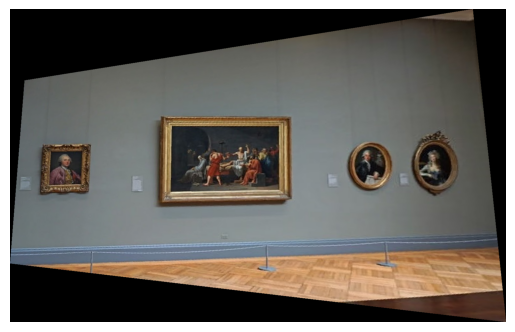

In [89]:
show_image(warped_paintings2.astype(np.uint8))

## Blend Images into a Mosaic

#### Mosaic for Living Room

In [985]:
def getDistanceTransform(img):
    binary_mask = np.any(img > 0, axis=2).astype(np.uint8)
    dist = cv2.distanceTransform(binary_mask, cv2.DIST_L2, 5)

    normalized_dist = cv2.normalize(dist, None, 0, 255, cv2.NORM_MINMAX)

    return dist, normalized_dist, binary_mask

In [986]:
def blur_image(pic, gaussian):
    new_img = np.zeros_like(pic)

    for channel in range(3):
        color = pic[:, :, channel]
        blurred_color = convolve2d(color, gaussian, mode="same", boundary="symm")

        new_img[:, :, channel] = blurred_color
        
    return new_img

In [987]:
def get_2_bands(im, binary_mask):
    gaussian_oned = cv2.getGaussianKernel(ksize=15, sigma=4)
    gaussian_twod = np.dot(gaussian_oned, gaussian_oned.T)
    
    im2, binary_mask2 = im.astype(np.float32), np.expand_dims(binary_mask, axis=-1)

    low_pass = blur_image(im2, gaussian=gaussian_twod)
    
    high_pass = im2 - low_pass
    high_pass = high_pass * binary_mask2

    low_pass, high_pass = low_pass.astype(np.float32), high_pass.astype(np.float32)

    return low_pass, high_pass

In [1014]:
def mosaic(warped_im, warped_max, im2):
    canvas_height = warped_im.shape[0] + im2.shape[0]
    canvas_width = warped_im.shape[1] + im2.shape[1]

    warped_max_x, warped_max_y = warped_max[0], warped_max[1]

    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    warped_height, warped_width = warped_im.shape[0], warped_im.shape[1]
    im2_height, im2_width = im2.shape[0], im2.shape[1]

    new_origin = [warped_height - warped_max_y, warped_width - warped_max_x]

    canvas1, canvas2 = canvas.copy(), canvas.copy()

    canvas1[:warped_im.shape[0], :warped_im.shape[1], :] = warped_im
    distA, distA_normalized, maskA = getDistanceTransform(canvas1)

    canvas2[new_origin[0]:new_origin[0] + im2_height, new_origin[1]:new_origin[1] + im2_width, :] = im2
    distB, distB_normalized, maskB = getDistanceTransform(canvas2)

    # show_image(distA, cmap="gray")
    # show_image(distB, cmap="gray")
    
    low_passA, high_passA = get_2_bands(canvas1, maskA)
    low_passB, high_passB = get_2_bands(canvas2, maskB)

    low_passA = np.clip(low_passA, 0, 255).astype(np.uint8)
    low_passB = np.clip(low_passB, 0, 255).astype(np.uint8)

    high_pass_boolean_arr = distA_normalized > distB_normalized
    high_pass_boolean_arr = np.expand_dims(high_pass_boolean_arr, axis=-1)

    high_pass_canvas = np.where(high_pass_boolean_arr, high_passA, high_passB)

    distA_weight, distB_weight = (distA / (distA + distB + 1e-5)), (distB / (distA + distB + 1e-5))
    distA_weight, distB_weight = np.expand_dims(distA_weight, axis=-1), np.expand_dims(distB_weight, axis=-1)

    low_pass_canvas = (distA_weight * low_passA) + (distB_weight * low_passB)

    low_pass_canvas = np.clip(low_pass_canvas, 0, 255).astype(np.uint8)

    canvas = low_pass_canvas + (high_pass_canvas * 2)

    return np.clip(canvas, 0, 255).astype(np.uint8)

In [1015]:
living_room_mosaic = mosaic(warped_test, warped_test_bounding_box[-1], living_room2)

In [999]:
cars_mosaic = mosaic(warped_cars, warped_cars_bounding_box[-1], cars2)

In [1000]:
desk_mosaic = mosaic(desk_warped, desk_warped_bounding_box[-1], desk2)

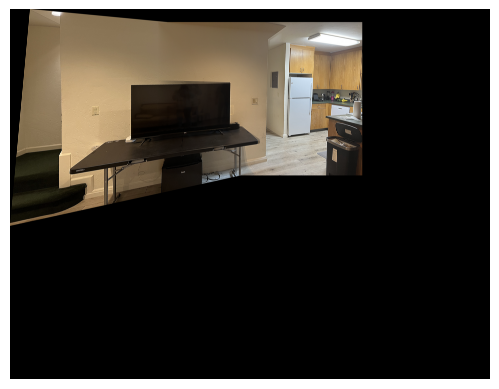

In [993]:
show_image(living_room_mosaic)

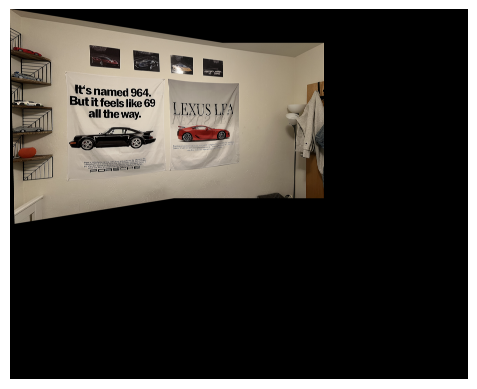

In [1001]:
show_image(cars_mosaic)

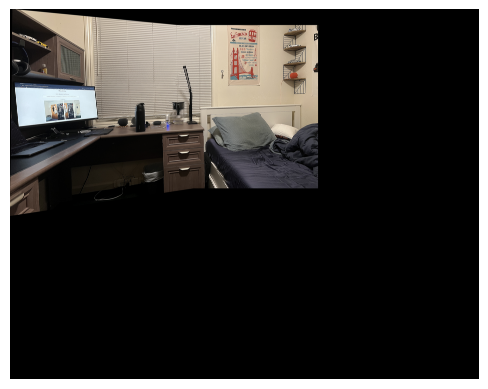

In [1002]:
show_image(desk_mosaic)

# Project 4B

## Detecting corner features

In [348]:
def dist2(x, c):
    """
    dist2  Calculates squared distance between two sets of points.

    Description
    D = DIST2(X, C) takes two matrices of vectors and calculates the
    squared Euclidean distance between them. Both matrices must be of
    the same column dimension.  If X has M rows and N columns, and C has
    L rows and N columns, then the result has M rows and L columns. The
    I, Jth entry is the squared distance from the Ith row of X to the
    Jth row of C.

    Adapted from code by Christopher M Bishop and Ian T Nabney.
    """
    
    ndata, dimx = x.shape
    ncenters, dimc = c.shape
    assert(dimx == dimc, 'Data dimension does not match dimension of centers')

    return (np.ones((ncenters, 1)) * np.sum((x**2).T, axis=0)).T + \
            np.ones((   ndata, 1)) * np.sum((c**2).T, axis=0)    - \
            2 * np.inner(x, c)

<>:18: SyntaxWarning: assertion is always true, perhaps remove parentheses?
<>:18: SyntaxWarning: assertion is always true, perhaps remove parentheses?
/var/folders/z5/r7gqymkd7jx3gkfz07cjc2r40000gn/T/ipykernel_18413/1345172653.py:18: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(dimx == dimc, 'Data dimension does not match dimension of centers')


In [181]:
def get_harris_corners(im, edge_discard=20, sigma=3, min_distance=50, threshold_rel=0.01):
    """
    This function takes a b&w image and an optional amount to discard
    on the edge (default is 5 pixels), and finds all harris corners
    in the image. Harris corners near the edge are discarded and the
    coordinates of the remaining corners are returned. A 2d array (h)
    containing the h value of every pixel is also returned.

    h is the same shape as the original image, im.
    coords is 2 x n (ys, xs).
    """

    image = cv2.cvtColor(im.astype(np.uint8), cv2.COLOR_RGB2GRAY)

    assert edge_discard >= 20

    # find harris corners
    h = corner_harris(image, method='eps', sigma=sigma) # returns a 2D array of float values where each pixel represents the Harris response at that location
    coords = peak_local_max(h, min_distance=min_distance, threshold_rel=threshold_rel)

    # discard points on edge
    edge = edge_discard  # pixels
    mask = (coords[:, 0] > edge) & \
        (coords[:, 0] < image.shape[0] - edge) & \
        (coords[:, 1] > edge) & \
        (coords[:, 1] < image.shape[1] - edge)
    coords = coords[mask].T
    
    return h, coords

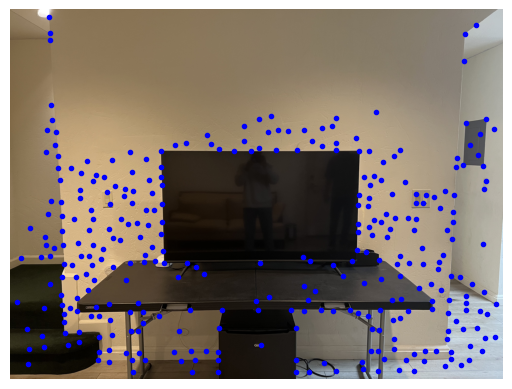

In [566]:
lr1_harris, lr1_coords = get_harris_corners(living_room1, threshold_rel=0.01) # lr1_harris contains a response value for each pixel
show_image(living_room1, points=np.array([[x, y] for y, x in lr1_coords.T]), with_points=True)

In [582]:
def anms(harris_response, coords, top_n=100):
    """
    - harris_response is a 2D array of same dimension as image that gives you each pixel's strength
    - coords is the list of coordinates of the corners returned by harris
    """

    # coords.T points are ordered y, x
    # harris_response is shaped same as image

    radii = [[np.inf, pt] for pt in coords.T] # this going to hold your min radii for each point
    scores = harris_response[coords.T[:, 0], coords.T[:, 1]]

    for index, point in enumerate(coords.T): # same order as radii
        score = scores[index]

        for j in range(len(coords.T)): # you want to iterate only through the other coordinates
            if j == index:
                continue

            comparison, other_score = [coords.T[j][0], coords.T[j][1]], scores[j]

            squared_sum = (comparison[0] - point[0]) ** 2 + (comparison[1] - point[1]) ** 2
            l2_dist = np.sqrt(squared_sum)

            if other_score > score and l2_dist < radii[index][0]:
                radii[index][0] = l2_dist
    
    sorted_radii = sorted(radii, key=lambda x: x[0], reverse=True)[:top_n]

    return [pt for d, pt in sorted_radii]


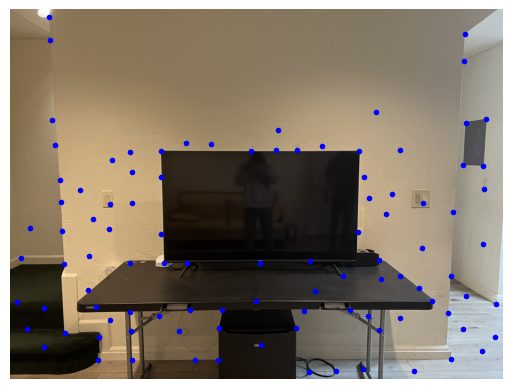

In [581]:
new_pts_lr1 = anms(lr1_harris, lr1_coords, 100)
display_pts_lr1 = np.array(np.array([[x, y] for y, x in new_pts_lr1]))

## Extracting Feature Descriptor for each feature point

In [737]:
def get_descriptors(im, points, scale_factor=0.2):    
    image, patches = cv2.cvtColor(im.astype(np.uint8), cv2.COLOR_RGB2GRAY), []

    # points are ordered y, x as well

    for y, x in points:
        min_y, min_x = max(0, y - 20), max(0, x - 20)
        max_y, max_x = min(y + 20, image.shape[0]), min(x + 20, image.shape[1])

        _40x40_patch = image[min_y:max_y, min_x:max_x]

        if _40x40_patch.shape[0] != 40 or _40x40_patch.shape[1] != 40:
            _40x40_patch = np.pad(_40x40_patch, (
                (0, 40 - _40x40_patch.shape[0]),
                (0, 40 - _40x40_patch.shape[1])),
                mode = 'constant', constant_values=0
            )
                    
        _8x8_patch = sk.transform.rescale(_40x40_patch, scale=scale_factor, anti_aliasing=True)

        # normalize the patch and flatten it

        mean, std = np.mean(_8x8_patch), np.std(_8x8_patch)
        if (std < 1e-5): std = std + 1e-5

        _8x8_patch = _8x8_patch - mean
        _8x8_patch = _8x8_patch / std

        patches.append(_8x8_patch.flatten())

    descriptors = np.array(patches)
    
    return descriptors

In [623]:
descriptors_lr1 = get_descriptors(living_room1, points=new_pts_lr1)

(3024, 4032)


In [586]:
lr2_harris, lr2_coords = get_harris_corners(living_room2, threshold_rel=0.01)

In [624]:
new_pts_lr2 = anms(lr2_harris, lr2_coords, 100)
display_pts_lr2 = np.array(np.array([[x, y] for y, x in new_pts_lr2])) # purely for plotting purposes

In [603]:
descriptors_lr2 = get_descriptors(living_room2, points=new_pts_lr2)

(3024, 4032)


### Result of ANMS on both images

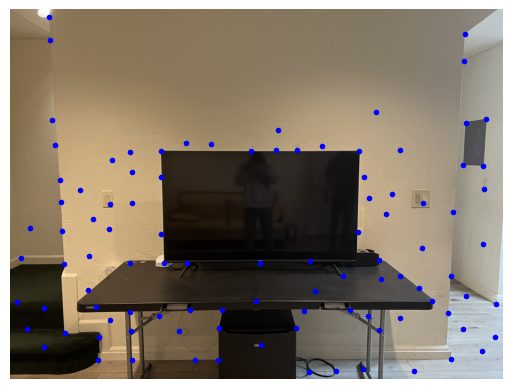

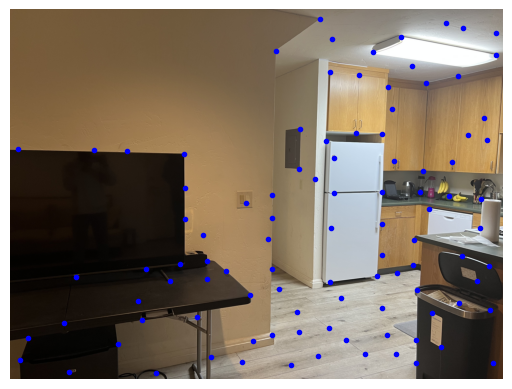

In [625]:
show_image(living_room1, display_pts_lr1, with_points=True)
show_image(living_room2, display_pts_lr2, with_points=True)

## Matching Feature Descriptor between two images

In [604]:
distances = dist2(descriptors_lr1, descriptors_lr2)

In [632]:
def return_matches(distances, lowes_ratio=0.75):
    matches = []

    for i in range(len(distances)):
        distances_to_B_indices = np.argsort(distances[i, :])

        nearest, second_nearest = distances_to_B_indices[0], distances_to_B_indices[1]

        if (distances[i, nearest] < (lowes_ratio * distances[i, second_nearest])):
            matches.append((i, nearest))
            
    return np.array(matches)

In [635]:
lr_matches = return_matches(distances)

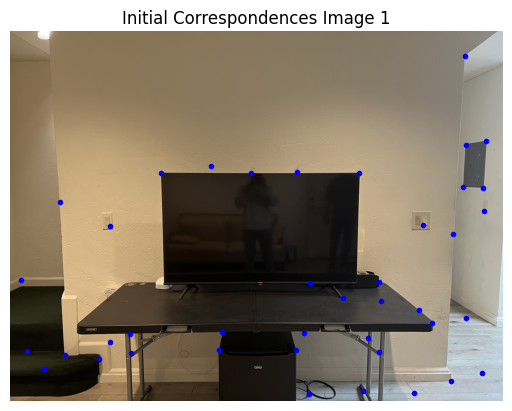

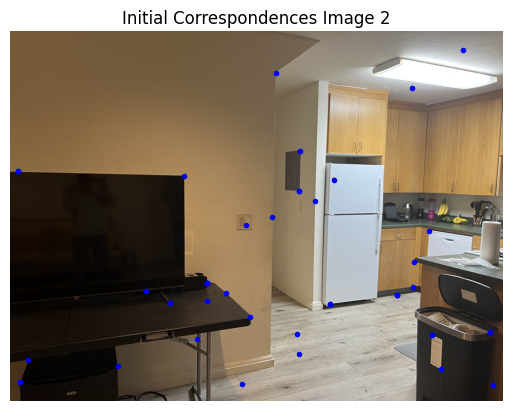

In [871]:
pts_A, pts_B = np.array(new_pts_lr1)[lr_matches[:, 0]], np.array(new_pts_lr2)[lr_matches[:, 1]]

show_image(living_room1, np.array([np.array([x, y]) for y, x in pts_A]), with_points=True, title="Initial Correspondences Image 1")
show_image(living_room2, np.array([np.array([x, y]) for y, x in pts_B]), with_points=True, title="Initial Correspondences Image 2")

## Use RANSAC to compute a homography

In [697]:
def computeH_ransac(im1_pts, im2_pts):
    A, b = np.zeros((len(im1_pts) * 2, 8)), np.zeros((len(im1_pts) * 2, 1))

    for i, (im1, im2) in enumerate(zip(im1_pts, im2_pts)):
        y, x, y_prime, x_prime = im1[0], im1[1], im2[0], im2[1] # line depends on ordering of points

        A[i * 2] = np.array([y, x, 1, 0, 0, 0, -y * y_prime, -x * y_prime])
        A[i * 2 + 1] = np.array([0, 0, 0, y, x, 1, -y * x_prime, -x * x_prime])

        b[i * 2] = y_prime
        b[i * 2 + 1] = x_prime
    
    h = np.linalg.lstsq(A, b, rcond=None)[0]
    h = np.append(h, 1)

    h = h.reshape(3, 3)

    return h

In [877]:
def ransac(pts1, pts2, matches, num_samples=4, num_iterations=500, inlier_threshold=400):
    best_inliers, final_h = [], None

    # pts1, pts2 are ordered y, x

    pts_A, pts_B = np.array(pts1)[matches[:, 0]], np.array(pts2)[matches[:, 1]]
    
    for _ in range(num_iterations):
        random_indices = np.random.choice(range(len(matches)), num_samples, replace=False)
        coords_A, coords_B = pts_A[random_indices], pts_B[random_indices]

        h, local_inliers = computeH_ransac(coords_A, coords_B), [] # h is 3x3 matrix, you're computing a new one each iteration

        dists = []

        for pt_1, pt_2 in zip(pts_A, pts_B):
            homogenous_pt = np.append(pt_1, 1)
            
            new_pt = np.dot(h, homogenous_pt)
            new_pt = new_pt / new_pt[2]
            new_pt = new_pt[:2]

            dist = np.sqrt(((new_pt - pt_2) ** 2).sum())

            dists.append(dist)

            if dist <= inlier_threshold:
                local_inliers.append([pt_1, pt_2])

        if len(local_inliers) > len(best_inliers):
            best_inliers = local_inliers.copy()
            final_h = h.copy()
        
    return best_inliers, final_h


In [814]:
inliers, H_2 = ransac(new_pts_lr1, new_pts_lr2, lr_matches, num_iterations=500)

In [846]:
correspondence_lr1 = np.array([pair[0] for pair in inliers])
correspondence_lr2 = np.array([pair[1] for pair in inliers])

display_correspondence_lr1 = np.array([[x, y] for y, x in correspondence_lr1])
display_correspondence_lr2 = np.array([[x, y] for y, x in correspondence_lr2])

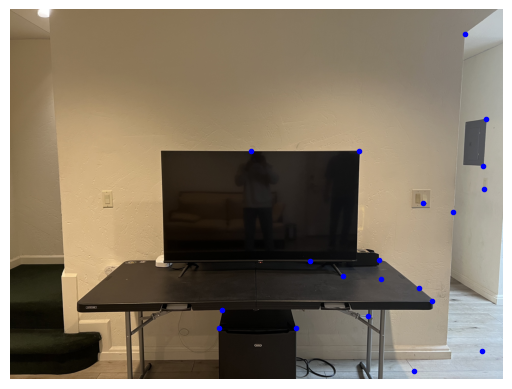

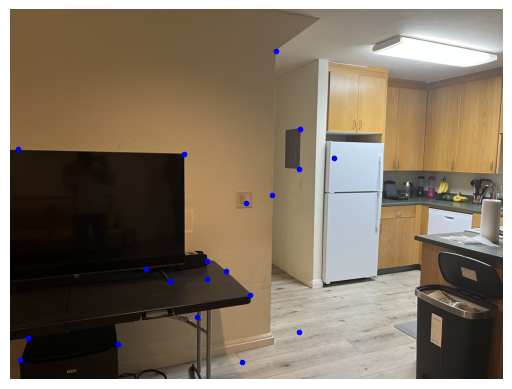

In [847]:
show_image(living_room1, display_correspondence_lr1, with_points=True)
show_image(living_room2, display_correspondence_lr2, with_points=True)

## Produce Mosaic

### Display Projected Points Alongside Actual Points

In [781]:
correspondence_lr1_homogenous = np.array([np.append(arr, 1) for arr in correspondence_lr1])

In [812]:
correspondence_lr1_warped = np.matmul(H_2, correspondence_lr1_homogenous.T)
correspondence_lr1_warped = (correspondence_lr1_warped / correspondence_lr1_warped[2]).astype(int)
correspondence_lr1_warped = correspondence_lr1_warped[:2]
correspondence_lr1_warped = correspondence_lr1_warped.T

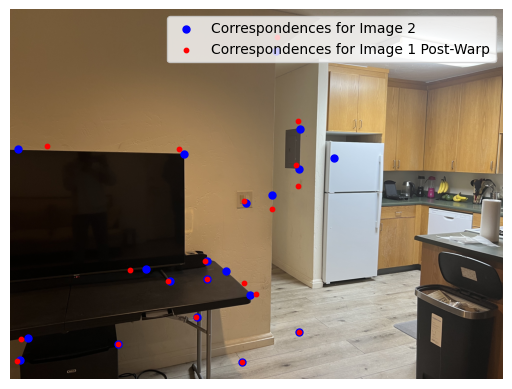

In [802]:
display_warped_lr1 = np.array([np.array([x, y]) for y, x in correspondence_lr1_warped])

plt.imshow(living_room2)
plt.scatter(display_correspondence_lr2[:, 0], display_correspondence_lr2[:, 1], s=25, color='blue', label='Correspondences for Image 2')
plt.scatter(display_warped_lr1[:, 0], display_warped_lr1[:, 1], color='red', s=10, label='Correspondences for Image 1 Post-Warp')

plt.legend()

plt.axis('off')
plt.show()

### Edited Warping Function

In [808]:
def imwarped_2(im, H):
    corners = np.array([
        [0, 0, 1],
        [im.shape[0], 0, 1],
        [0, im.shape[1], 1],
        [im.shape[0], im.shape[1], 1]
    ])

    warped_corners = np.matmul(H, corners.T)
    warped_corners = warped_corners / warped_corners[2]

    min_x_prime, min_y_prime = int(np.min(warped_corners[1])), int(np.min(warped_corners[0]))
    max_x_prime, max_y_prime = int(np.max(warped_corners[1])), int(np.max(warped_corners[0]))
    
    warped = np.zeros((max_y_prime - min_y_prime, max_x_prime - min_x_prime, 3))

    for row in range(len(warped)):
        for col in range(len(warped[0])):
            orig_pts = np.dot(np.linalg.inv(H), [row + min_y_prime, col + min_x_prime, 1])
            orig_pts = orig_pts / orig_pts[2]

            if 0 <= orig_pts[0] < im.shape[0] and 0 <= orig_pts[1] < im.shape[1]:
                warped[row, col, :] = im[int(orig_pts[0]), int(orig_pts[1])]
    
    bounding_box = np.array([[min_y_prime, min_x_prime], [min_y_prime, max_x_prime], [max_y_prime, min_x_prime], [max_y_prime, max_x_prime]])
        
    return (warped, bounding_box)

### Start process for Living Room Pictures

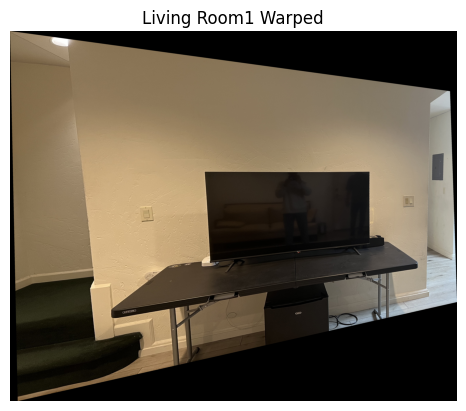

In [979]:
lr1_warped, lr1_bounding_box = imwarped_2(living_room1, H_2)
show_image(lr1_warped.astype(np.uint8), title="Living Room1 Warped")

In [980]:
arr = lr1_bounding_box[-1]
arr[0], arr[1] = arr[1], arr[0]

lr_mosaic = mosaic(lr1_warped, arr, living_room2)

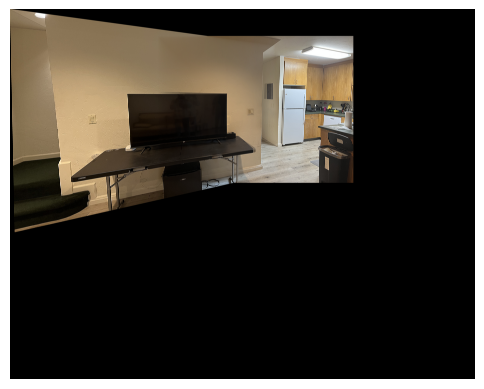

In [981]:
show_image(lr_mosaic.astype(np.uint8))

### Repeat for car posters now

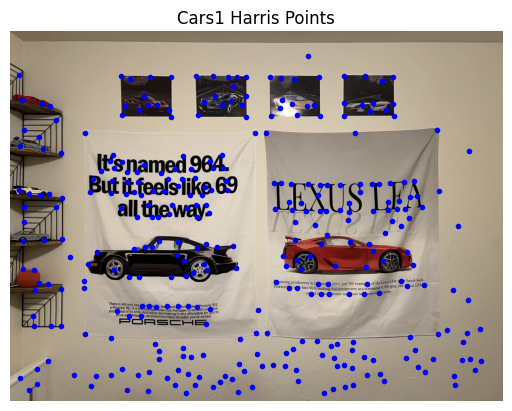

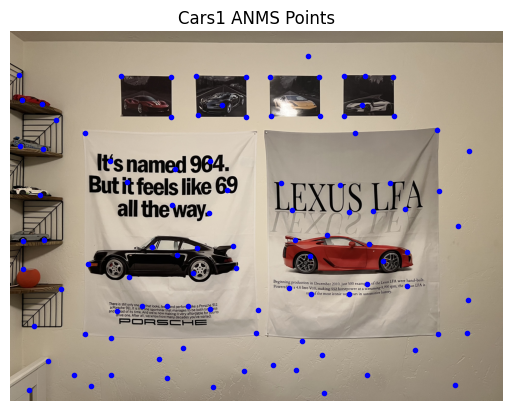

In [873]:
cars1_harris, cars1_coords = get_harris_corners(cars1, threshold_rel=0.01)

anms_cars1 = anms(cars1_harris, cars1_coords, 100)
display_pts_cars1 = np.array(np.array([[x, y] for y, x in anms_cars1]))

show_image(cars1, points=np.array([[x, y] for y, x in cars1_coords.T]), with_points=True, title="Cars1 Harris Points")
show_image(cars1, display_pts_cars1, with_points=True, title="Cars1 ANMS Points")

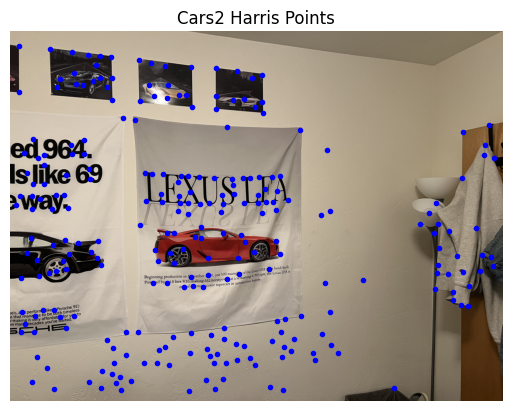

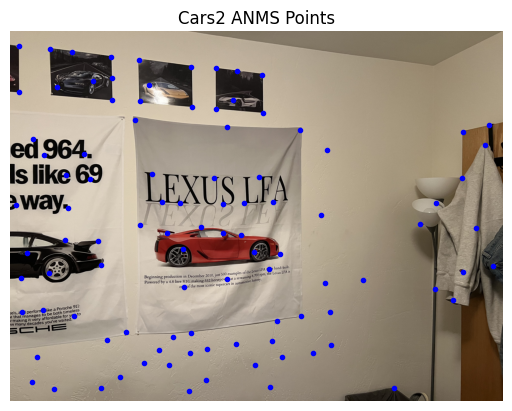

In [872]:
cars2_harris, cars2_coords = get_harris_corners(cars2, threshold_rel=0.01)
anms_cars2 = anms(cars2_harris, cars2_coords, 100)

display_pts_cars2 = np.array(np.array([[x, y] for y, x in anms_cars2]))

show_image(cars2, points=np.array([[x, y] for y, x in cars2_coords.T]), with_points=True, title="Cars2 Harris Points")
show_image(cars2, display_pts_cars2, with_points=True, title="Cars2 ANMS Points")

In [874]:
descriptors_cars1 = get_descriptors(cars1, points=anms_cars1)
descriptors_cars2 = get_descriptors(cars2, points=anms_cars2)

distances_cars = dist2(descriptors_cars1, descriptors_cars2)

cars_matches = return_matches(distances_cars)

In [906]:
inliers_cars, H_cars = ransac(anms_cars1, anms_cars2, cars_matches, num_iterations=500, inlier_threshold=5)

In [908]:
correspondence_cars1 = np.array([pair[0] for pair in inliers_cars])
correspondence_cars2 = np.array([pair[1] for pair in inliers_cars])

In [909]:
display_correspondence_cars1 = np.array([[x, y] for y, x in correspondence_cars1])
display_correspondence_cars2 = np.array([[x, y] for y, x in correspondence_cars2])

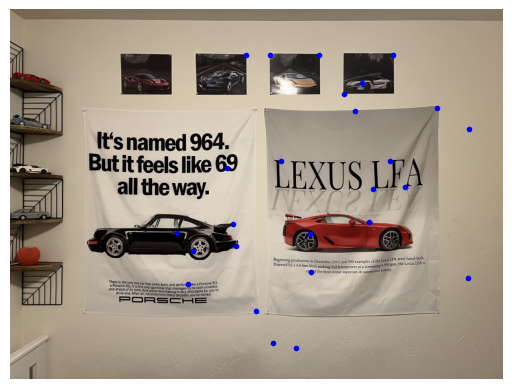

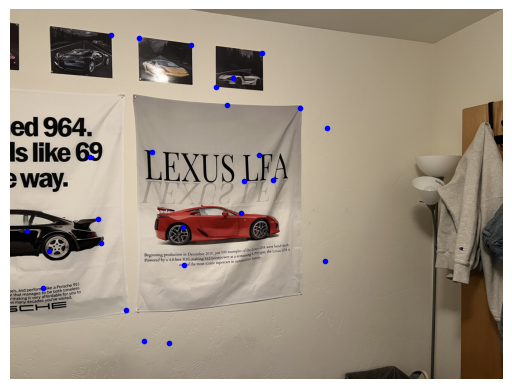

In [959]:
show_image(cars1, display_correspondence_cars1, with_points=True)
show_image(cars2, display_correspondence_cars2, with_points=True)

In [910]:
correspondence_cars1_homogenous = np.array([np.append(arr, 1) for arr in correspondence_cars1])

In [915]:
correspondence_cars1_warped = np.matmul(H_cars, correspondence_cars1_homogenous.T)
correspondence_cars1_warped = (correspondence_cars1_warped / correspondence_cars1_warped[2]).astype(int)
correspondence_cars1_warped = correspondence_cars1_warped[:2]
correspondence_cars1_warped = correspondence_cars1_warped.T

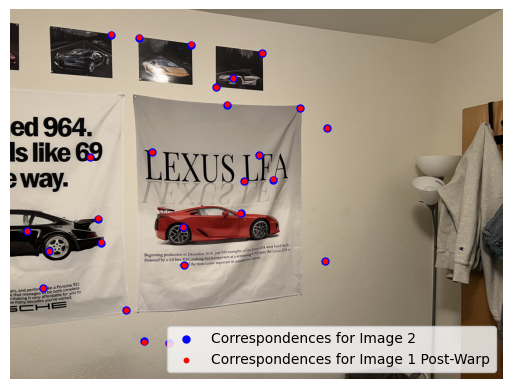

In [916]:
display_warped_cars1 = np.array([np.array([x, y]) for y, x in correspondence_cars1_warped])

plt.imshow(cars2)
plt.scatter(display_correspondence_cars2[:, 0], display_correspondence_cars2[:, 1], s=25, color='blue', label='Correspondences for Image 2')
plt.scatter(display_warped_cars1[:, 0], display_warped_cars1[:, 1], color='red', s=10, label='Correspondences for Image 1 Post-Warp')

plt.legend()

plt.axis('off')
plt.show()

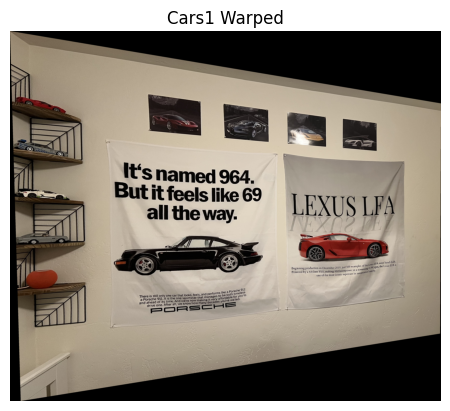

In [917]:
cars1_warped, cars1_bounding_box = imwarped_2(cars1, H_cars)
show_image(cars1_warped.astype(np.uint8), title="Cars1 Warped")

In [952]:
arr_cars = cars1_bounding_box[-1]
arr_cars[0], arr_cars[1] = arr_cars[1], arr_cars[0]

cars_mosaic = mosaic(cars1_warped, arr_cars, cars2)

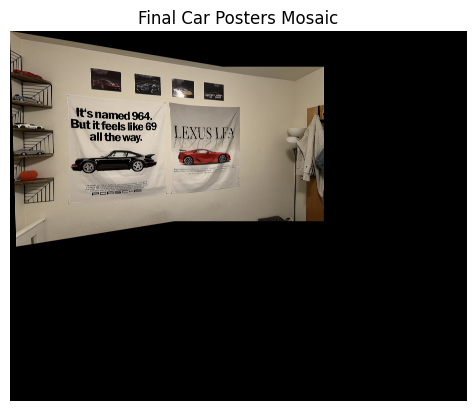

In [984]:
show_image(cars_mosaic, title="Final Car Posters Mosaic")

### Repeat for Desk Images

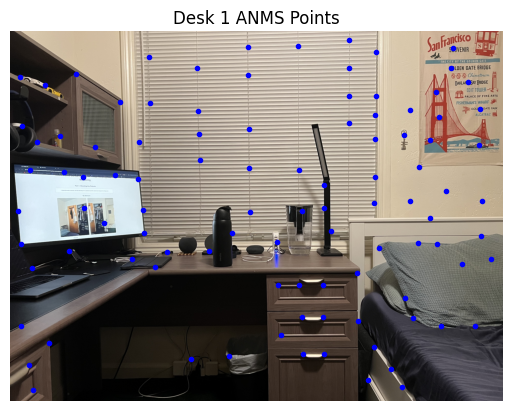

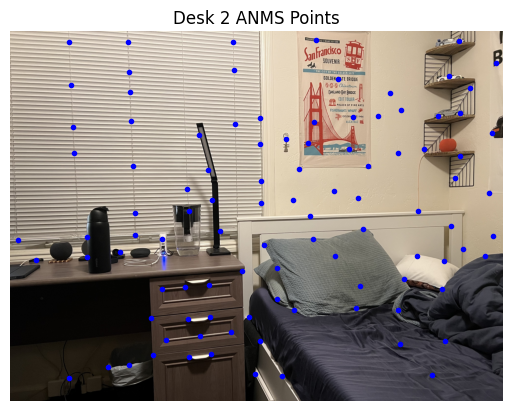

In [960]:
desk1_harris, desk1_coords = get_harris_corners(desk1, threshold_rel=0.01)

anms_desk1 = anms(desk1_harris, desk1_coords, 100)
display_pts_desk1 = np.array(np.array([[x, y] for y, x in anms_desk1]))

desk2_harris, desk2_coords = get_harris_corners(desk2, threshold_rel=0.01)

anms_desk2 = anms(desk2_harris, desk2_coords, 100)
display_pts_desk2 = np.array(np.array([[x, y] for y, x in anms_desk2]))

show_image(desk1, display_pts_desk1, with_points=True, title="Desk 1 ANMS Points")
show_image(desk2, display_pts_desk2, with_points=True, title="Desk 2 ANMS Points")

In [961]:
descriptors_desk1 = get_descriptors(desk1, points=anms_desk1)
descriptors_desk2 = get_descriptors(desk2, points=anms_desk2)

distances_desk = dist2(descriptors_desk1, descriptors_desk2)

desk_matches = return_matches(distances_desk)

In [974]:
inliers_desk, H_desk = ransac(anms_desk1, anms_desk2, desk_matches, num_iterations=500, inlier_threshold=15)

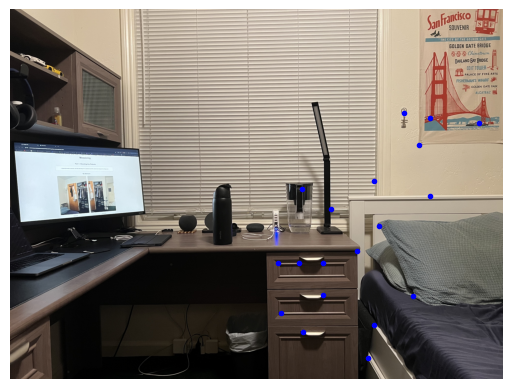

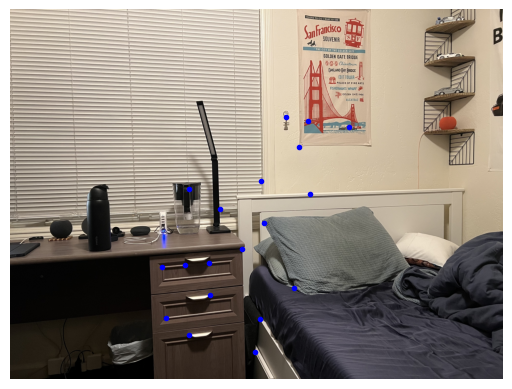

In [975]:
correspondence_desk1 = np.array([pair[0] for pair in inliers_desk])
correspondence_desk2 = np.array([pair[1] for pair in inliers_desk])

display_correspondence_desk1 = np.array([[x, y] for y, x in correspondence_desk1])
display_correspondence_desk2 = np.array([[x, y] for y, x in correspondence_desk2])

show_image(desk1, display_correspondence_desk1, with_points=True)
show_image(desk2, display_correspondence_desk2, with_points=True)

In [976]:
correspondence_desk1_homogenous = np.array([np.append(arr, 1) for arr in correspondence_desk1])

correspondence_desk1_warped = np.matmul(H_desk, correspondence_desk1_homogenous.T)
correspondence_desk1_warped = (correspondence_desk1_warped / correspondence_desk1_warped[2]).astype(int)
correspondence_desk1_warped = correspondence_desk1_warped[:2]
correspondence_desk1_warped = correspondence_desk1_warped.T

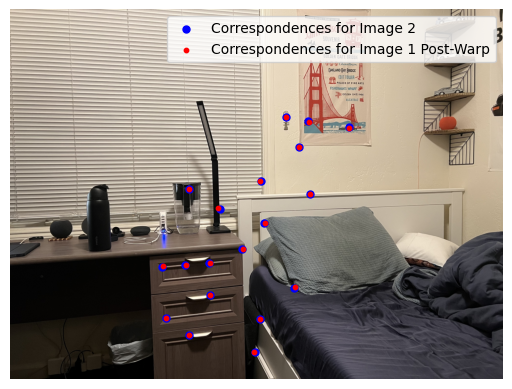

In [977]:
display_warped_desk1 = np.array([np.array([x, y]) for y, x in correspondence_desk1_warped])

plt.imshow(desk2)
plt.scatter(display_correspondence_desk2[:, 0], display_correspondence_desk2[:, 1], s=25, color='blue', label='Correspondences for Image 2')
plt.scatter(display_warped_desk1[:, 0], display_warped_desk1[:, 1], color='red', s=10, label='Correspondences for Image 1 Post-Warp')

plt.legend()

plt.axis('off')
plt.show()

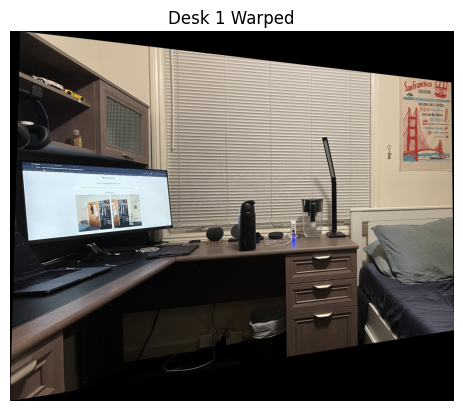

In [978]:
desk1_warped, desk1_bounding_box = imwarped_2(desk1, H_desk)
show_image(desk1_warped.astype(np.uint8), title="Desk 1 Warped")

In [982]:
arr_desk = desk1_bounding_box[-1]
arr_desk[0], arr_desk[1] = arr_desk[1], arr_desk[0]

desk_mosaic = mosaic(desk1_warped, arr_desk, desk2)

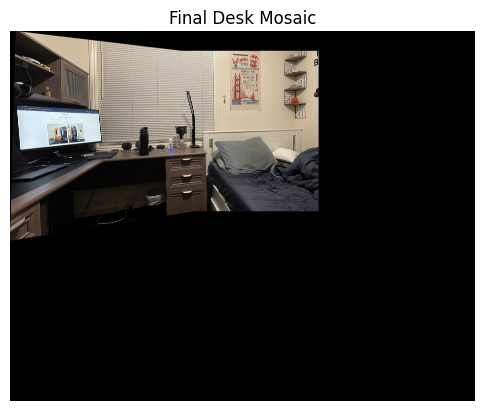

In [983]:
show_image(desk_mosaic, title="Final Desk Mosaic")

## Function to run entire image-stitching process

In [1017]:
def mosaic_auto(im1, im2, threshold_rel, top_n, inlier_threshold, num_iterations):

    # get harris corners and respective coordinates
    im1_harris, im1_coords = get_harris_corners(im1, threshold_rel=threshold_rel)

    # conduct ANMS to narrow down to top_n points
    new_pts_im1 = anms(im1_harris, im1_coords, top_n=top_n)

    # get your feature descriptors
    descriptors_im1 = get_descriptors(im1, points=new_pts_im1)

    # --------- repeat on im2 ---------

    im2_harris, im2_coords = get_harris_corners(im2, threshold_rel=threshold_rel)
    new_pts_im2 = anms(im2_harris, im2_coords, top_n=top_n)
    descriptors_im2 = get_descriptors(im2, points=new_pts_im2)
    
    # get your distances matrix
    distances = dist2(descriptors_im1, descriptors_im2)

    # get your matching points
    im_matches = return_matches(distances)
    
    # get your inliers and homography matrix
    inliers, H_2 = ransac(new_pts_im1, new_pts_im2, im_matches, inlier_threshold=inlier_threshold,num_iterations=num_iterations)

    # split into correspondence points
    correspondence_im1 = np.array([pair[0] for pair in inliers])
    correspondence_im2 = np.array([pair[1] for pair in inliers])    
    
    correspondence_im1_homogenous = np.array([np.append(arr, 1) for arr in correspondence_im1])

    correspondence_im1_warped = np.matmul(H_2, correspondence_im1_homogenous.T)
    correspondence_im1_warped = (correspondence_im1_warped / correspondence_im1_warped[2]).astype(int)
    correspondence_im1_warped = correspondence_im1_warped[:2]
    correspondence_im1_warped = correspondence_im1_warped.T

    # get your warped image and it's bounding box
    im1_warped, im1_bounding_box = imwarped_2(im1, H_2)

    arr = im1_bounding_box[-1]
    arr[0], arr[1] = arr[1], arr[0]

    final_mosaic = mosaic(im1_warped, arr, im2).astype(np.uint8)

    show_image(final_mosaic)

    return final_mosaic

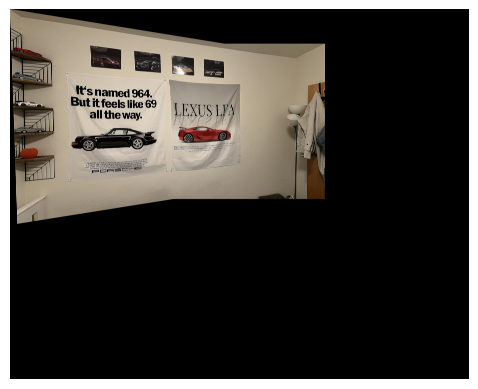

In [1018]:
cars_final_2 = mosaic_auto(cars1, cars2, threshold_rel=0.01, top_n=100, inlier_threshold=15, num_iterations=500)

In [ ]:
desk_final_2 = mosaic_auto(desk1, desk2, threshold_rel=0.01, top_n=100, inlier_threshold=15, num_iterations=500)

In [ ]:
living_room_final_2 = mosaic_auto(living_room1, living_room2, threshold_rel=0.01, top_n=100, inlier_threshold=15, num_iterations=500)